# Reading in GridRad-Severe Data Part 1: Radar Reflectivity and Azimuthal Shear 

```{image} ../thumbnails/thumbnail.png
:alt: GridRad-Severe Version 4.2 logo
:width: 200px
```

---

## Overview 
For some severe weather events in the Northeast U.S., there has been some observations of severe thunderstorms being influenced by the dynamics of local topography by producing a local enhancement of severe reports or lightning. Past studies such as {cite:t}`Wasula:2002`, {cite:t}`LeBel:2021` and {cite:t}`Kramer:2025` have analyzed more specific severe weather events across the central New York region and how some storms were enhanced in severity by processes such as valley channeling and vortex stretching from changes in terrain elevation. In this study, we seek to look at different severe thunderstorm events in the Northeast and study how local topography influences the intensity and distribution of these events. A few severe weather events we will look at in particular is the May 4, 2018 EF1 tornado in southern New Hampshire, and the July 29, 2021 EF2 tornado along the New Jersey/Pennsylvania border. Previous notebooks in this project have made great use of ERA5 reanalysis data, ERA5 sounding data, and GLM GOES-16 Lightning Data to analyze these severe events. Now, we can utilize yet another database to further analyze the supercell thunderstorms and severe weather environment surrounding them, that being GridRad-Severe. This is a gridded radar reflectivity dataset developed by {cite:t}`Murphy:2023` that contains radar data from over 100 stations across the CONUS. This notebook will read in and make animations of two different data variables: radar reflectivity and velocity spectrum width, and then there will be a second notebook that will look at two additional data variables from the dataset. 

1. Prerequisites
2. Imports
3. Content
4. Summary
5. Conclusion/Next Steps
6. Resources and References

## Prerequisites

| Concepts | Importance | Notes |
| --- | --- | --- |
| [Intro to Numpy](https://foundations.projectpythia.org/core/numpy/) | Necessary | |
| [Intro to Cartopy](https://foundations.projectpythia.org/core/cartopy/cartopy) | Necessary | |
| [Intro to Pandas](https://foundations.projectpythia.org/core/pandas/) | Necessary | |
| [Understanding of Xarray](https://foundations.projectpythia.org/core/xarray/) | Helpful | Analysis of gridded datasets |
| [Understanding of Matplotlib](https://foundations.projectpythia.org/core/matplotlib/) | Helpful | Creating plots in Python |
| [Using Gridradpy Library](https://github.com/tsupinie/gridradpy) | Helpful | Specifically load in and use GridRad data | 

- **Time to learn**: About 1 hour (10 minutes per subsection)

---

## Imports

Let's first start with importing all the necessary libraries we will need here. We will need cartopy to create maps with specified projections, in conjunction with matplotlib for making plots. We can then import xarray, which is helpful for working with and analyzing gridded datasets such as GridRad-Severe, in addition to the numpy package for scientific computing. 

In [90]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd 

## Content #1: Importing and Plotting a GridRad Radar Reflectivity File

One helpful way to analyze past severe thunderstorms is reading in and plotting a singular GR-S radar file to see how the structure of the storm looked on radar. We can do this by using xarray's open_dataset function to open and decode the NetCDF file. For now, I will define the file path that contains the radar file to my current research folder. I then use xarray to open the data set within the file path. The radar netCDF file is hosted by the NSF NCAR Geoscience Data Exchange (GDEX) website: https://gdex.ucar.edu/datasets/d841006/dataaccess

In [91]:
file_path = '/nfs/mulholland_lab/acolgate/Research/2018/2018/nexrad_3d_v4_2_20180505T012500Z.nc' 
ds = xr.open_dataset(file_path)

Let's then further inspect the dataset to understand its structure, dimensions, and variables:

In [92]:
print(ds)

<xarray.Dataset> Size: 79MB
Dimensions:                    (Sweep: 418, Altitude: 29, Latitude: 576,
                                Longitude: 576, Index: 1000394, time: 1)
Coordinates:
  * Altitude                   (Altitude) float64 232B 0.5 1.0 1.5 ... 21.0 22.0
  * Latitude                   (Latitude) float64 5kB 36.01 36.03 ... 47.99
  * Longitude                  (Longitude) float64 5kB 278.0 278.0 ... 290.0
  * time                       (time) datetime64[ns] 8B 2018-05-05T01:25:00
Dimensions without coordinates: Sweep, Index
Data variables: (12/18)
    sweeps_merged              (Sweep) |S29 12kB ...
    Nradobs                    (Altitude, Latitude, Longitude) int8 10MB ...
    Nradecho                   (Altitude, Latitude, Longitude) int8 10MB ...
    index                      (Index) int32 4MB ...
    Reflectivity               (Index) float32 4MB ...
    wReflectivity              (Index) float32 4MB ...
    ...                         ...
    DifferentialReflectivity

The radar reflectivity data is contained under the `Reflectivity` data variable. This is the variable we will plot first. 

To plot the reflectivity, we first need to reconstruct a 3D grid of reflecitivity data from 1-D data points. We do this by extracting 1D arrays from the Longitude, Latitude and Altitude data points, which calculates the number of each point on each dimension.

In [93]:
ds

<xarray.Dataset> Size: 79MB
Dimensions:                    (Sweep: 418, Altitude: 29, Latitude: 576,
                                Longitude: 576, Index: 1000394, time: 1)
Coordinates:
  * Altitude                   (Altitude) float64 232B 0.5 1.0 1.5 ... 21.0 22.0
  * Latitude                   (Latitude) float64 5kB 36.01 36.03 ... 47.99
  * Longitude                  (Longitude) float64 5kB 278.0 278.0 ... 290.0
  * time                       (time) datetime64[ns] 8B 2018-05-05T01:25:00
Dimensions without coordinates: Sweep, Index
Data variables: (12/18)
    sweeps_merged              (Sweep) |S29 12kB ...
    Nradobs                    (Altitude, Latitude, Longitude) int8 10MB ...
    Nradecho                   (Altitude, Latitude, Longitude) int8 10MB ...
    index                      (Index) int32 4MB ...
    Reflectivity               (Index) float32 4MB ...
    wReflectivity              (Index) float32 4MB ...
    ...                         ...
    DifferentialReflectivity   (Index) float32 4MB ...
    wDifferentialReflectivity  (Index) float32 4MB ...
    DifferentialPhase          (Index) float32 4MB ...
    wDifferentialPhase         (Index) float32 4MB ...
    CorrelationCoefficient     (Index) float32 4MB ...
    wCorrelationCoefficient    (Index) float32 4MB ...
Attributes: (12/16)
    Name:                   GridRad
    Description:            Three-dimensional gridded NEXRAD radar reflectivi...
    Analysis_time:          2018-05-05 01:25:00Z
    Analysis_time_window:   all azimuth scans (elevation angles) with central...
    Algorithm_version:      v4_2
    Algorithm_description:  Space and time binning weighted by distances from...
    ...                     ...
    Storage_scheme:         netCDF-4, sparse
    Data_source:            Amazon Web Services
    Data_source_URL:        https://www.ncdc.noaa.gov/data-access/radar-data/...
    Authors:                Cameron R. Homeyer, School of Meteorology, Univer...
    Project_sponsor:        National Oceanic and Atmospheric Administration, ...
    Project_name:           0-3 Hour Tornado Prediction Using the Warn on For...

In [94]:
lon_vals = ds['Longitude'].values
lat_vals = ds['Latitude'].values
alt_vals = ds['Altitude'].values

Then, we initialize a 3D numpy array and fill it entirely with `np.nan` to represent missing data points:

In [95]:
nlon, nlat, nalt = len(lon_vals), len(lat_vals), len(alt_vals)
reflectivity_grid = np.full((nalt, nlat, nlon), np.nan)

Next, we decode the index since it contains the 1-D grid boxes to plot the radar reflectivity, and the actual reflectivity variable. We can use integer division and modulo operator functions to calculate longitude (i), latitude (j), and altitude (k) indexes. After that, we can finally build the 3D refl. grid by assigning the measured `refl` values to their correct 3D coordinates. 

In [96]:
index = ds['index'].values
refl = ds['Reflectivity'].values

k = index // (nlat * nlon)
j = (index % (nlat * nlon)) // nlon
i = index % nlon

reflectivity_grid[k, j, i] = refl

Next, we find the maximum value in the reflectivity grid along the altitude dimension, then create a masked array that hides any max. values that are equal to 0 or less than five:

In [97]:
colmax_refl = np.nanmax(reflectivity_grid, axis=0)  
colmax_masked = np.ma.masked_where(np.isnan(colmax_refl) | (colmax_refl < 5), colmax_refl)

/tmp/ipykernel_2707085/2232845460.py:1: RuntimeWarning: All-NaN slice encountered
  colmax_refl = np.nanmax(reflectivity_grid, axis=0)


Next, we define the interval for data sampling. In this case, it would be 1 to make sure every data variable is selected.

In [98]:
step = 1
lons = lon_vals[::step] # Slice the lon_vals and lat_vals arrays, so lons and lats become copies of all variables in lon_vals and lat_vals
lats = lat_vals[::step]
colmax_ds = colmax_masked[::step, ::step] # Slice a 2D array and select all rows and all columns
lon_grid, lat_grid = np.meshgrid(lon_vals, lat_vals) # Use meshgrid to generate all possible lat/lon pairs that form a rectangular grid

Then, let's get to actually plotting this. I mainly used matplotlib functions here to plot the Column-Max Reflectivity, using a smoother type of shading so that the reflectivity looks more higher resolution. We add map features such as states, borders, and coastlines. For this first graph, I centered it over the start point of the May 4, 2018 NH tornado, which first formed around 0118 UTC 5-5-2018 (May 4th local time) at the coordinates of 43.15° N, 72.45° W, or the Walpole, NH area. The tornado then ended at the coordinates of 43.29° N, 71.73° W, or just south of Webster, NH, after traveling 37.5 miles. The storm ended up being rated EF1. We can look the radar reflectivity at that time to analyze the storm that produced the tornado, and also set a lat/lon extent centered over that region to get a clearer view. 

For this, it would be best to make a colormesh plot, and we can use matplotlib functions to make a colorbar, add map features, make gridlines and a plot title. Also, I set a lat/lon extent which was centered around the Vermont/NH border area. 

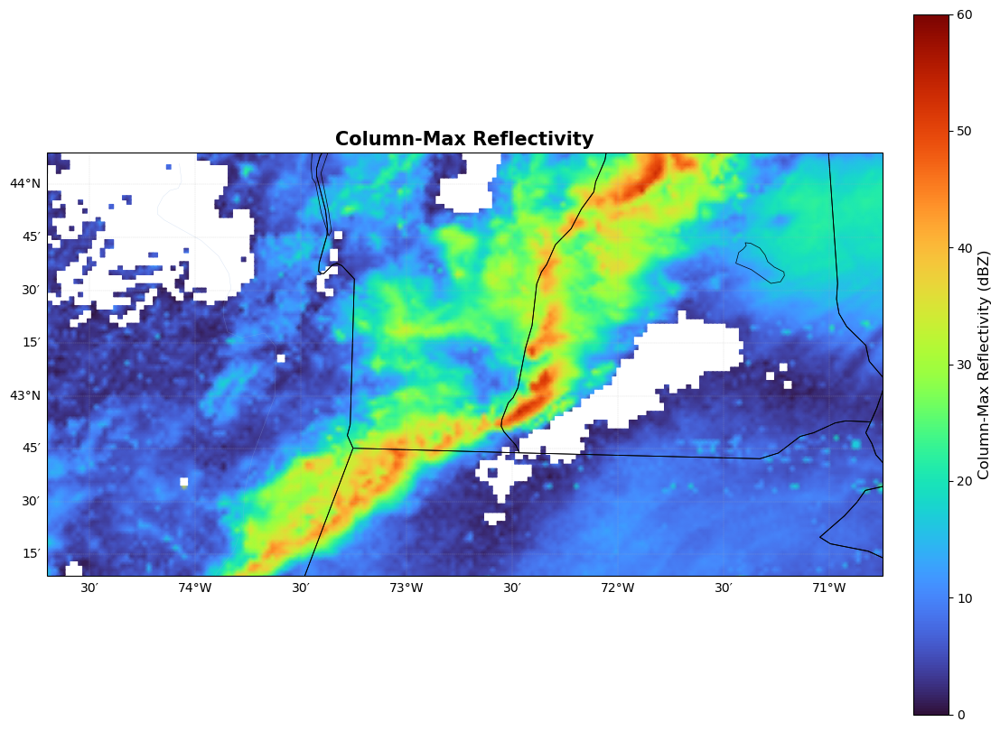

In [99]:
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(12, 10)) # Create the matplotlib figure 

pcm = ax.pcolormesh( # Add colormesh plot 
    lon_grid, lat_grid, colmax_refl,
    cmap='turbo',          # Use 'turbo' colormap which is best for plotting dBZ values 
    vmin=-0, vmax=60,  # Set minimum and maximum values to 60, which is typical for a refl. plot
    shading='gouraud',      # Add this to make the data pixels a bit smoother 
    transform=ccrs.PlateCarree() # We use PlateCarree map projection for lat/lon 
)

cbar = plt.colorbar(pcm, ax=ax, orientation='vertical', shrink=0.8, pad=0.03)
cbar.set_label('Column-Max Reflectivity (dBZ)', fontsize=12)
cbar.ax.tick_params(labelsize=10)

# Map features
ax.add_feature(cfeature.STATES.with_scale('50m'), linewidth=0.6)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linewidth=0.7)
ax.add_feature(cfeature.LAKES.with_scale('50m'), edgecolor='black', facecolor='none', linewidth=0.5)
ax.add_feature(cfeature.RIVERS.with_scale('50m'), linewidth=0.3, alpha=0.4)
ax.coastlines(resolution='50m', linewidth=0.7)

extent = [-74.7, -70.75, 42.15, 44.15]

ax.set_extent(extent, crs=ccrs.PlateCarree()) 

gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.5, linewidth=0.3, linestyle='--')
gl.top_labels = False
gl.right_labels = False

ax.set_title('Column-Max Reflectivity', fontsize=15, weight='bold')
plt.tight_layout()
plt.show()

In the radar reflectivity plot, you can make out the couplet right along the VT/NH border which ended up producing a tornado. We will animate this later to better see the evolution of this storm. 

:::{note}
GridRad data is severely skewed to the low-end of its distribution, so some deeper reflectivity colors, like what would be typically seen in a NWS radar image might not show up as well. The maximum and minimum values might have to be modified a bit to make it look more realistic. 
:::

Next, we will look at the July 29, 2021 severe event. We can set up the same reflectivity plot we made before, this time loading in a radar file with a date/time around the start of the event. I re-defined the data methods I used with a "2" added at the end, to avoid overlapping in the notebook. 

In [100]:
file_path2 = '/nfs/mulholland_lab/acolgate/Research/2021/2021/nexrad_3d_v4_2_20210729T220500Z.nc' 
ds2 = xr.open_dataset(file_path2) 
print(ds2)

<xarray.Dataset> Size: 79MB
Dimensions:                    (Sweep: 733, Altitude: 29, Latitude: 624,
                                Longitude: 576, Index: 972593, time: 1)
Coordinates:
  * Altitude                   (Altitude) float64 232B 0.5 1.0 1.5 ... 21.0 22.0
  * Latitude                   (Latitude) float64 5kB 33.01 33.03 ... 45.99
  * Longitude                  (Longitude) float64 5kB 274.0 274.0 ... 286.0
  * time                       (time) datetime64[ns] 8B 2021-07-29T22:05:00
Dimensions without coordinates: Sweep, Index
Data variables: (12/18)
    sweeps_merged              (Sweep) |S29 21kB ...
    Nradobs                    (Altitude, Latitude, Longitude) int8 10MB ...
    Nradecho                   (Altitude, Latitude, Longitude) int8 10MB ...
    index                      (Index) int32 4MB ...
    Reflectivity               (Index) float32 4MB ...
    wReflectivity              (Index) float32 4MB ...
    ...                         ...
    DifferentialReflectivity 

I re-defined much of the data functions by adding a "2" at the end to them, to avoid any overlapping. 

In [101]:
lon_vals2 = ds2["Longitude"].values
lat_vals2 = ds2["Latitude"].values
alt_vals2 = ds2['Altitude'].values

nlon2, nlat2, nalt2 = len(lon_vals2), len(lat_vals2), len(alt_vals2)
reflectivity_grid2 = np.full((nalt2, nlat2, nlon2), np.nan)

index2 = ds2['index'].values
refl2 = ds2['Reflectivity'].values

k2 = index2 // (nlat2 * nlon2)
j2 = (index2 % (nlat2 * nlon2)) // nlon2
i2 = index2 % nlon2

reflectivity_grid2[k2, j2, i2] = refl2

colmax_refl2 = np.nanmax(reflectivity_grid2, axis=0)  
colmax_masked2 = np.ma.masked_where(np.isnan(colmax_refl2) | (colmax_refl2 < 5), colmax_refl2)

step = 1
lons2 = lon_vals2[::step] # Slice the lon_vals and lat_vals arrays, so lons and lats become copies of all variables in lon_vals and lat_vals
lats2 = lat_vals2[::step]
colmax_ds2 = colmax_masked2[::step, ::step] # Slice a 2D array and select all rows and all columns
lon_grid2, lat_grid2 = np.meshgrid(lon_vals2, lat_vals2) # Use meshgrid to generate all possible lat/lon pairs that form a rectangular grid

/tmp/ipykernel_2707085/2163438093.py:17: RuntimeWarning: All-NaN slice encountered
  colmax_refl2 = np.nanmax(reflectivity_grid2, axis=0)


The tornado began at 2159 UTC 7-29-2021 at the coordinates 40.35° N, 74.95° W, S of New Hope, PA, and ended at 2214 UTC at 40.3° N, 74.85° W, in Hopewell Township, NJ, and ended up being rated an EF2. 

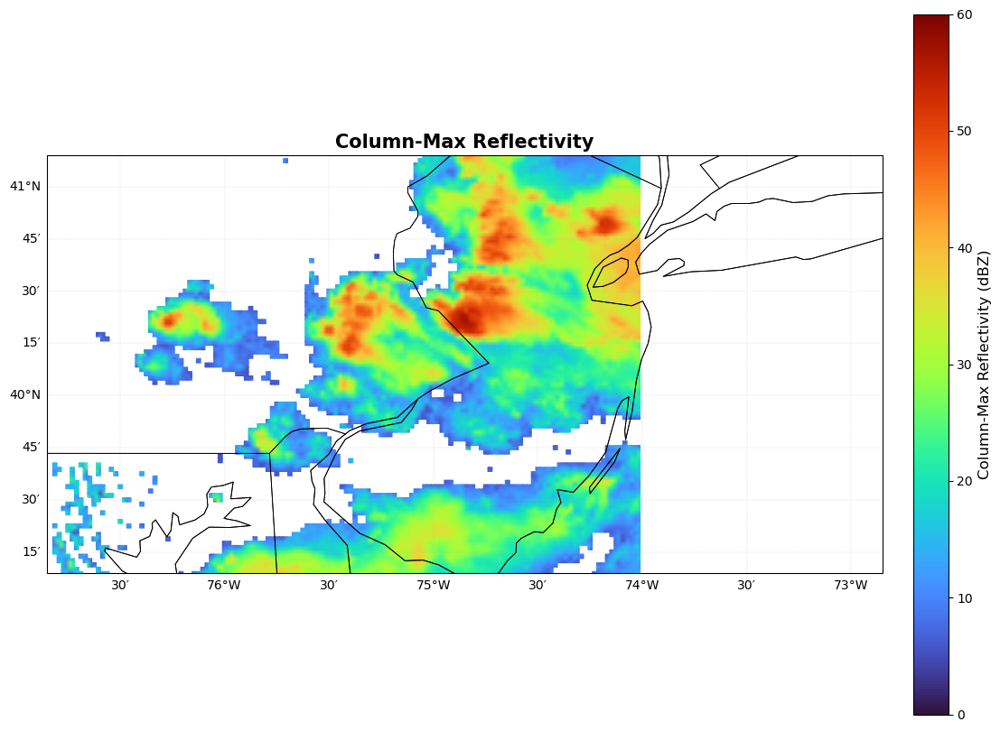

In [102]:
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(12, 10)) # Create the matplotlib figure 

pcm = ax.pcolormesh( # Add colormesh plot 
    lon_grid2, lat_grid2, colmax_ds2,
    cmap='turbo',          # Use 'turbo' colormap which is best for plotting dBZ values 
    vmin=-0, vmax=60,  # Set minimum and maximum values to 60, which is typical for a refl. plot
    shading='gouraud',      # Add this to make the data pixels a bit smoother 
    transform=ccrs.PlateCarree() # We use PlateCarree map projection for lat/lon 
)

cbar = plt.colorbar(pcm, ax=ax, orientation='vertical', shrink=0.8, pad=0.03)
cbar.set_label('Column-Max Reflectivity (dBZ)', fontsize=12)
cbar.ax.tick_params(labelsize=10)

# Map features
ax.add_feature(cfeature.STATES.with_scale('50m'), linewidth=0.6)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linewidth=0.7)
ax.add_feature(cfeature.LAKES.with_scale('50m'), edgecolor='black', facecolor='none', linewidth=0.5)
ax.add_feature(cfeature.RIVERS.with_scale('50m'), linewidth=0.3, alpha=0.4)
ax.coastlines(resolution='50m', linewidth=0.7)

extent2 = [-76.85, -72.85, 39.15, 41.15]

ax.set_extent(extent2, crs=ccrs.PlateCarree()) 

gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.5, linewidth=0.3, linestyle='--')
gl.top_labels = False
gl.right_labels = False

ax.set_title('Column-Max Reflectivity', fontsize=15, weight='bold')
plt.tight_layout()
plt.show()

Here, you can clearly make out the supercell along the PA/NJ border that produced the EF2 tornado which traveled along the Delaware River.

:::{note}
For this file, the GridRad domain stops after -74 degrees W, resulting in the cut-off of data on the right side of the figure.
:::

## Content #2: Plotting the Azimuthal Shear 

As seen earlier when we read in the datafile, radar reflectivity is not the only data variable we can plot. Another variable that would be helpful to measure any areas of rotation is the azimuthal shear, or the change in wind velocity over a distance in the horizontal direciton, measured in s^-1. This is a common variable that is used in the study of mesocyclones, and is represented in the GR-S dataset by the variable `AzShear`.

We can set this up very similary to how we defined the reflectivity grid, except this time we base it around the 'AzShear' data variable, once again re-defining the data methods.  

In [103]:
lon_vals3 = ds['Longitude'].values
lat_vals3 = ds['Latitude'].values
alt_vals3 = ds['Altitude'].values

nlon3, nlat3, nalt3 = len(lon_vals3), len(lat_vals3), len(alt_vals3)

azshear_grid = np.full((nalt3, nlat3, nlon3), np.nan, dtype=np.float32)

index3 = ds['index'].values
azshear = ds['AzShear'].values

k3 = index3 // (nlat3 * nlon3)
j3 = (index3 % (nlat3 * nlon3)) // nlon3
i3 = index3 % nlon3

azshear_grid[k3, j3, i3] = azshear

We once again use numpy arrays to calculate the AZ shear values on the first axis, and remove any dimensions of size 1 from the 'colmax_azshear' array by using numpy's `squeeze` function. 

In [104]:
colmax_azshear = np.nanmax(azshear_grid, axis=0)
colmax_azshear = np.squeeze(colmax_azshear)

/tmp/ipykernel_2707085/3185089806.py:1: RuntimeWarning: All-NaN slice encountered
  colmax_azshear = np.nanmax(azshear_grid, axis=0)


We can then make the plot using very similar functions to the reflectivity plot. We first create the rectangular grid by creating two 2-D arrays and create objects for a color plot. Here, it is more applicable to use a diverging colormap ("RuBu_r") for positive (red) and negative (blue) values. For MRMS AzShear values, it works best to set minimum and maximum values of -0.005 and 0.005 for the color scale. Then, use the same shading option to smooth the pixels. Finally, we can use the same map features, zoom extent, and colorbar settings that we used before. 

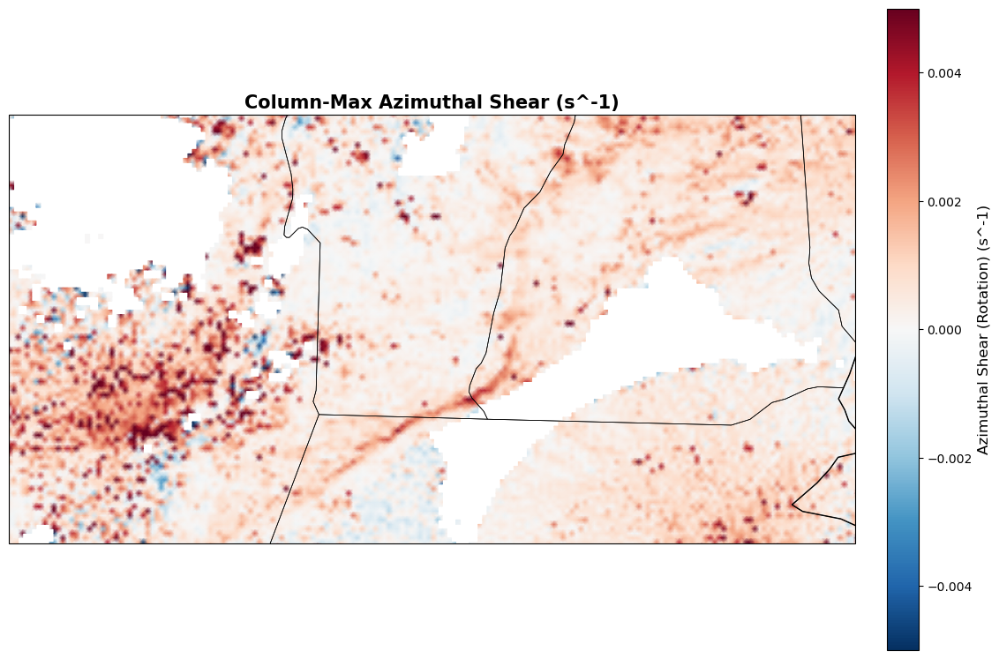

In [105]:
lon_grid3, lat_grid3 = np.meshgrid(lon_vals3, lat_vals3)

fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(12, 10))

pcm = ax.pcolormesh(
    lon_grid3, lat_grid3, colmax_azshear,
    cmap='RdBu_r',          
    vmin=-0.005, vmax=0.005,  
    shading='gouraud',     
    transform=ccrs.PlateCarree()
)

ax.add_feature(cfeature.STATES.with_scale('50m'), linewidth=0.5)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linewidth=0.7)
ax.coastlines(resolution='50m')

extent = [-74.7, -70.75, 42.15, 44.15]
ax.set_extent(extent, crs=ccrs.PlateCarree())

cbar = plt.colorbar(pcm, ax=ax, orientation='vertical', shrink=0.75, pad=0.03)
cbar.set_label("Azimuthal Shear (Rotation) (s^-1)", fontsize=12)
cbar.ax.tick_params(labelsize=10)

ax.set_title("Column-Max Azimuthal Shear (s^-1)", fontsize=15, weight='bold')
plt.tight_layout()
plt.show()

While a bit messy, you can make out some local areas of maximized AZshear along the squall line across southwestern NH and into southern VT. Let's now do the same thing with the July 29th supercells. 

In [106]:
lon_vals4 = ds2['Longitude'].values
lat_vals4 = ds2['Latitude'].values
alt_vals4 = ds2['Altitude'].values

nlon4, nlat4, nalt4 = len(lon_vals4), len(lat_vals4), len(alt_vals4)

azshear_grid2 = np.full((nalt4, nlat4, nlon4), np.nan, dtype=np.float32)

index4 = ds2['index'].values
azshear2 = ds2['AzShear'].values

k4 = index4 // (nlat4 * nlon4)
j4 = (index4 % (nlat4 * nlon4)) // nlon4
i4 = index4 % nlon4

azshear_grid2[k4, j4, i4] = azshear2

In [107]:
colmax_azshear2 = np.nanmax(azshear_grid2, axis=0)
colmax_azshear2 = np.squeeze(colmax_azshear2)

/tmp/ipykernel_2707085/1407709777.py:1: RuntimeWarning: All-NaN slice encountered
  colmax_azshear2 = np.nanmax(azshear_grid2, axis=0)


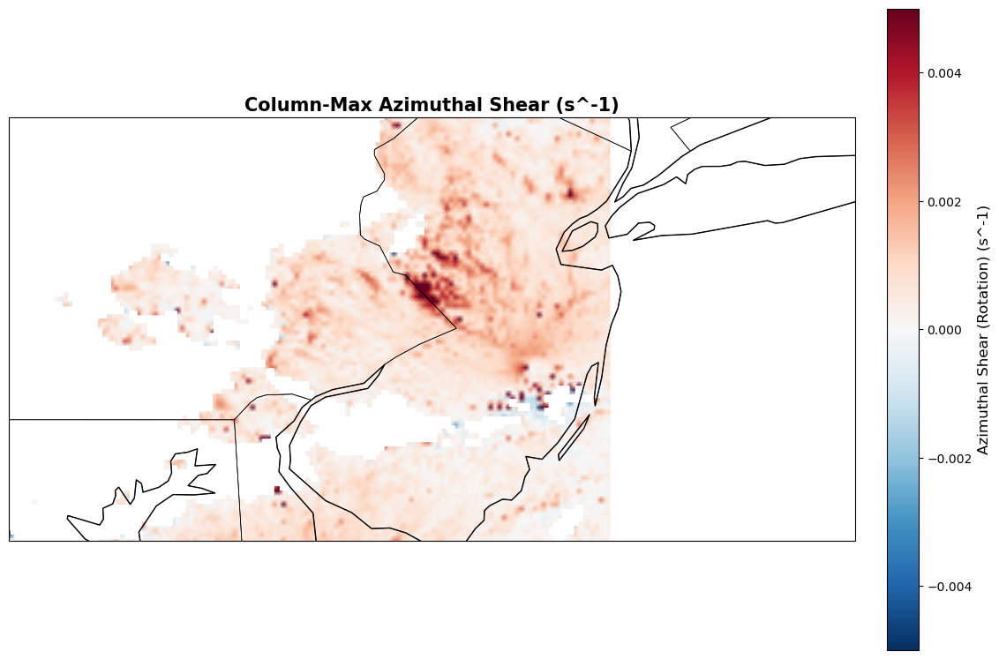

In [108]:
lon_grid4, lat_grid4 = np.meshgrid(lon_vals4, lat_vals4)

fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(12, 10))

pcm = ax.pcolormesh(
    lon_grid4, lat_grid4, colmax_azshear2,
    cmap='RdBu_r',          
    vmin=-0.005, vmax=0.005,  
    shading='gouraud',     
    transform=ccrs.PlateCarree()
)

ax.add_feature(cfeature.STATES.with_scale('50m'), linewidth=0.5)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linewidth=0.7)
ax.coastlines(resolution='50m')

extent2 = [-76.85, -72.85, 39.15, 41.15]
ax.set_extent(extent2, crs=ccrs.PlateCarree())

cbar = plt.colorbar(pcm, ax=ax, orientation='vertical', shrink=0.75, pad=0.03)
cbar.set_label("Azimuthal Shear (Rotation) (s^-1)", fontsize=12)
cbar.ax.tick_params(labelsize=10)

ax.set_title("Column-Max Azimuthal Shear (s^-1)", fontsize=15, weight='bold')
plt.tight_layout()
plt.show()

On this graph, it is much clearer to see the very strong AZ shear values above 0.004 s^-1 in the New Hope supercell, indicating very strong rotation.

Now that we have plotted images of reflectivity and AZ shear, it would be very helpful to now make animations of these variables to see how they evolve over time, based on multiple .nc GridRad files that we can load in at once. 

Let's first start with the reflectivity. First, we need to import some additional functions: the glob module to find all datafiles in a certain pattern and load them in at once, and the FuncAnimation and FFMpegWriter Matplotlib classes to create animations and save them as video files. Next, we will setup a definition to begin the building process for the reflectivity animation. 

In [109]:
import glob
from matplotlib.animation import FuncAnimation

def decode_gridrad_reflectivity(ds):
    """
    Decode sparse GridRad reflectivity (v4.2) to full 3D reflectivity array.
    Returns array with shape:
        (Altitude, Latitude, Longitude)
    """

    nz = ds["Altitude"].size
    ny = ds["Latitude"].size
    nx = ds["Longitude"].size # Reads the number of grid points in the X, Y, Z dimensions

    # Initialize the full 3D grid with NaN values initially
    Z = np.full((nz, ny, nx), np.nan, dtype=np.float32)

    # Sparse arrays
    refl = ds["Reflectivity"].values   # Radar data points 
    idx  = ds["index"].values.astype(np.int64) # corresponding linearized indices

    plane_size = ny * nx # Calculating 3D coordinates from linear indices using integer division and modulo functions 
    
    alt = idx // plane_size
    rem = idx % plane_size
    lat = rem // nx
    lon = rem % nx

    # Filling the 3D grid 
    Z[alt, lat, lon] = refl

    return Z

We will then use glob to find all the .nc files tailored to a specific directory pattern, and use xarray to load them in. 

In [110]:
# Search for the specific directory path to find all GridRad files for May 4th, 2018 (May 5th UTC)
nc_files = sorted(glob.glob("/nfs/mulholland_lab/acolgate/Research/2018/2018/nexrad_3d_v4_2_20180505T*.nc"))

# Initialize: 
colmax_list = [] # 2-D column max arrays for each time step
times = [] # Timestamp string for each file 

print(f"Found {len(nc_files)} GridRad files") 

# loop through files and process all data 
for f in nc_files:
    print("Processing:", f)
    ds = xr.open_dataset(f) # Open data file using xarray 

    # Decode sparse reflectivity data 
    Z3d = decode_gridrad_reflectivity(ds)

    # Calculate column-max reflectivity along vertical axis 
    colmax = np.nanmax(Z3d, axis=0)   # (Lat, Lon)
    colmax_list.append(colmax) # Append 2D data array to 'colmax_list'

    # Store timestamp
    time_string = str(ds["time"].values[0])  # Pull timestamp from the dataset and add it to 'times' list 
    ts = pd.to_datetime(time_string) # Convert time string to 'DateTime' format
    ts = ts.tz_localize('UTC') # Make timezone UTC aware 
    utc_ts = ts.tz_convert("UTC") # Convert timezone to UTC time 
    time_format = f"{utc_ts.strftime('%Y-%m-%d %H:%M:%S %Z')}" # Format datetime object into a string 
    times.append(str(time_format)) # Append to 'times' list 

colmax_array = np.stack(colmax_list) # Combine all 2D arrays into a single 3D numpy array (Time, latitude, Longitude)

# Extract lat/lon coordinates from ds, and use meshgrid to create 2D grids of lat/lon values 
lats = ds["Latitude"].values
lons = ds["Longitude"].values
lon_grid, lat_grid = np.meshgrid(lons, lats)

Found 11 GridRad files
Processing: /nfs/mulholland_lab/acolgate/Research/2018/2018/nexrad_3d_v4_2_20180505T010500Z.nc
Processing: /nfs/mulholland_lab/acolgate/Research/2018/2018/nexrad_3d_v4_2_20180505T011000Z.nc


/tmp/ipykernel_2707085/1523281450.py:19: RuntimeWarning: All-NaN slice encountered
  colmax = np.nanmax(Z3d, axis=0)   # (Lat, Lon)
/tmp/ipykernel_2707085/1523281450.py:19: RuntimeWarning: All-NaN slice encountered
  colmax = np.nanmax(Z3d, axis=0)   # (Lat, Lon)


Processing: /nfs/mulholland_lab/acolgate/Research/2018/2018/nexrad_3d_v4_2_20180505T011500Z.nc
Processing: /nfs/mulholland_lab/acolgate/Research/2018/2018/nexrad_3d_v4_2_20180505T012000Z.nc


/tmp/ipykernel_2707085/1523281450.py:19: RuntimeWarning: All-NaN slice encountered
  colmax = np.nanmax(Z3d, axis=0)   # (Lat, Lon)
/tmp/ipykernel_2707085/1523281450.py:19: RuntimeWarning: All-NaN slice encountered
  colmax = np.nanmax(Z3d, axis=0)   # (Lat, Lon)


Processing: /nfs/mulholland_lab/acolgate/Research/2018/2018/nexrad_3d_v4_2_20180505T012500Z.nc
Processing: /nfs/mulholland_lab/acolgate/Research/2018/2018/nexrad_3d_v4_2_20180505T013000Z.nc


/tmp/ipykernel_2707085/1523281450.py:19: RuntimeWarning: All-NaN slice encountered
  colmax = np.nanmax(Z3d, axis=0)   # (Lat, Lon)
/tmp/ipykernel_2707085/1523281450.py:19: RuntimeWarning: All-NaN slice encountered
  colmax = np.nanmax(Z3d, axis=0)   # (Lat, Lon)


Processing: /nfs/mulholland_lab/acolgate/Research/2018/2018/nexrad_3d_v4_2_20180505T013500Z.nc
Processing: /nfs/mulholland_lab/acolgate/Research/2018/2018/nexrad_3d_v4_2_20180505T014000Z.nc


/tmp/ipykernel_2707085/1523281450.py:19: RuntimeWarning: All-NaN slice encountered
  colmax = np.nanmax(Z3d, axis=0)   # (Lat, Lon)
/tmp/ipykernel_2707085/1523281450.py:19: RuntimeWarning: All-NaN slice encountered
  colmax = np.nanmax(Z3d, axis=0)   # (Lat, Lon)


Processing: /nfs/mulholland_lab/acolgate/Research/2018/2018/nexrad_3d_v4_2_20180505T014500Z.nc
Processing: /nfs/mulholland_lab/acolgate/Research/2018/2018/nexrad_3d_v4_2_20180505T015000Z.nc


/tmp/ipykernel_2707085/1523281450.py:19: RuntimeWarning: All-NaN slice encountered
  colmax = np.nanmax(Z3d, axis=0)   # (Lat, Lon)
/tmp/ipykernel_2707085/1523281450.py:19: RuntimeWarning: All-NaN slice encountered
  colmax = np.nanmax(Z3d, axis=0)   # (Lat, Lon)


Processing: /nfs/mulholland_lab/acolgate/Research/2018/2018/nexrad_3d_v4_2_20180505T015500Z.nc


/tmp/ipykernel_2707085/1523281450.py:19: RuntimeWarning: All-NaN slice encountered
  colmax = np.nanmax(Z3d, axis=0)   # (Lat, Lon)


We can then finally make the actual graph, based on our newly-build reflectivity grid. We will first animate the May 4, 2018 severe thunderstorms, as we had looked at before, and do the same thing for the 7-29-21 event. 

In [111]:
fig, ax = plt.subplots(
    figsize=(12, 10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

# First frame 
pcm = ax.pcolormesh(
    lon_grid, lat_grid, np.zeros_like(colmax_array[0]),
    cmap="turbo", vmin=0, vmax=60,
    shading="gouraud",
    transform=ccrs.PlateCarree()
)

# Colorbar
cbar = fig.colorbar(pcm, ax=ax, shrink=0.8, pad=0.02)
cbar.set_label("Column-Max Reflectivity (dBZ)", fontsize=12)

# Map features
ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.6)
ax.add_feature(cfeature.BORDERS.with_scale("50m"), linewidth=0.7)
ax.add_feature(cfeature.LAKES.with_scale("50m"), edgecolor="black", facecolor="none", linewidth=0.5)
ax.add_feature(cfeature.RIVERS.with_scale("50m"), linewidth=0.3, alpha=0.4)
ax.coastlines(resolution="50m", linewidth=0.7)

# Use same extent as before. 
ax.set_extent([-74.7, -70.45, 42.15, 44.15])

title = ax.set_title("Column-Max Reflectivity", fontsize=15, weight="bold")

# Defines how the plot should change over time and then initializes the animation object. 
def update(frame): # 'frame' is an integer representing the current frame number
    pcm.set_array(colmax_array[frame].ravel()) # The 'ravel' object flattens the 2D lat/lon array into a 1D array 
    title.set_text(f"Column-Max Reflectivity at {times[frame]}") # Updates title of plot to display the correct timestamp 
    return pcm, title

anim = FuncAnimation(
    fig, update,
    frames=len(colmax_array), # Defines total number of frames in animation
    interval=250, # Sets frame delay 
    blit=False # It is best to set blitting to false when drawing maps 
)

plt.close(fig) # Closes the first frame so it does not also display in the notebook

# Want to display animation interactive inside the notebook, import the IPython.display class to display an HTML inside JupyterLab
from IPython.display import HTML  

HTML(anim.to_jshtml())

Upon seeing the animation, the evolution of the storm embedded within the squall line, as well as the squall line itself, can be better made out. You can see the refl. couplet intensify a bit upon approaching the NH border, and then rapidly shifting off to the north/northeast before weakening a bit towards the end of the animation. 

Let's make the same animation now with the July 29th event. It is best to redefine everything as we did before. 

In [112]:
def decode_gridrad_reflectivity2(ds2):
    """
    Decode sparse GridRad reflectivity (v4.2) to full 3D reflectivity array.
    Returns array with shape:
        (Altitude, Latitude, Longitude)
    """

    nz2 = ds2["Altitude"].size
    ny2 = ds2["Latitude"].size
    nx2 = ds2["Longitude"].size

    Z2 = np.full((nz2, ny2, nx2), np.nan, dtype=np.float32)

    refl2 = ds2["Reflectivity"].values   # (Index,)
    idx2  = ds2["index"].values.astype(np.int64)

    plane_size2 = ny2 * nx2
    
    alt2 = idx2 // plane_size2
    rem2 = idx2 % plane_size2
    lat2 = rem2 // nx2
    lon2 = rem2 % nx2

    Z2[alt2, lat2, lon2] = refl2

    return Z2

In [113]:
nc_files2 = sorted(glob.glob("/nfs/mulholland_lab/acolgate/Research/2021/2021/nexrad_3d_v4_2_20210729T*.nc"))

colmax_list2 = []
times2 = []

print(f"Found {len(nc_files2)} GridRad files")

for f in nc_files2:
    print("Processing:", f)
    ds = xr.open_dataset(f)

    Z3d2 = decode_gridrad_reflectivity2(ds)

    colmax2 = np.nanmax(Z3d2, axis=0)  
    colmax_list2.append(colmax2)

    time_string2 = str(ds["time"].values[0])  
    ts2 = pd.to_datetime(time_string2)
    ts2 = ts2.tz_localize('UTC')
    utc_ts2 = ts2.tz_convert("UTC")
    time_format2 = f"{utc_ts2.strftime('%Y-%m-%d %H:%M:%S %Z')}"
    times2.append(str(time_format2))

colmax_array2 = np.stack(colmax_list2)

lats2 = ds2["Latitude"].values
lons2 = ds2["Longitude"].values
lon_grid2, lat_grid2 = np.meshgrid(lons2, lats2)

Found 11 GridRad files
Processing: /nfs/mulholland_lab/acolgate/Research/2021/2021/nexrad_3d_v4_2_20210729T214000Z.nc


/tmp/ipykernel_2707085/3695763690.py:14: RuntimeWarning: All-NaN slice encountered
  colmax2 = np.nanmax(Z3d2, axis=0)


Processing: /nfs/mulholland_lab/acolgate/Research/2021/2021/nexrad_3d_v4_2_20210729T214500Z.nc


/tmp/ipykernel_2707085/3695763690.py:14: RuntimeWarning: All-NaN slice encountered
  colmax2 = np.nanmax(Z3d2, axis=0)


Processing: /nfs/mulholland_lab/acolgate/Research/2021/2021/nexrad_3d_v4_2_20210729T215000Z.nc


/tmp/ipykernel_2707085/3695763690.py:14: RuntimeWarning: All-NaN slice encountered
  colmax2 = np.nanmax(Z3d2, axis=0)


Processing: /nfs/mulholland_lab/acolgate/Research/2021/2021/nexrad_3d_v4_2_20210729T215500Z.nc


/tmp/ipykernel_2707085/3695763690.py:14: RuntimeWarning: All-NaN slice encountered
  colmax2 = np.nanmax(Z3d2, axis=0)


Processing: /nfs/mulholland_lab/acolgate/Research/2021/2021/nexrad_3d_v4_2_20210729T220000Z.nc


/tmp/ipykernel_2707085/3695763690.py:14: RuntimeWarning: All-NaN slice encountered
  colmax2 = np.nanmax(Z3d2, axis=0)
/tmp/ipykernel_2707085/3695763690.py:14: RuntimeWarning: All-NaN slice encountered
  colmax2 = np.nanmax(Z3d2, axis=0)


Processing: /nfs/mulholland_lab/acolgate/Research/2021/2021/nexrad_3d_v4_2_20210729T220500Z.nc
Processing: /nfs/mulholland_lab/acolgate/Research/2021/2021/nexrad_3d_v4_2_20210729T221000Z.nc


/tmp/ipykernel_2707085/3695763690.py:14: RuntimeWarning: All-NaN slice encountered
  colmax2 = np.nanmax(Z3d2, axis=0)


Processing: /nfs/mulholland_lab/acolgate/Research/2021/2021/nexrad_3d_v4_2_20210729T221500Z.nc


/tmp/ipykernel_2707085/3695763690.py:14: RuntimeWarning: All-NaN slice encountered
  colmax2 = np.nanmax(Z3d2, axis=0)


Processing: /nfs/mulholland_lab/acolgate/Research/2021/2021/nexrad_3d_v4_2_20210729T222000Z.nc


/tmp/ipykernel_2707085/3695763690.py:14: RuntimeWarning: All-NaN slice encountered
  colmax2 = np.nanmax(Z3d2, axis=0)


Processing: /nfs/mulholland_lab/acolgate/Research/2021/2021/nexrad_3d_v4_2_20210729T222500Z.nc


/tmp/ipykernel_2707085/3695763690.py:14: RuntimeWarning: All-NaN slice encountered
  colmax2 = np.nanmax(Z3d2, axis=0)


Processing: /nfs/mulholland_lab/acolgate/Research/2021/2021/nexrad_3d_v4_2_20210729T223000Z.nc


/tmp/ipykernel_2707085/3695763690.py:14: RuntimeWarning: All-NaN slice encountered
  colmax2 = np.nanmax(Z3d2, axis=0)


In [114]:
fig, ax = plt.subplots(
    figsize=(12, 10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

# First frame
pcm = ax.pcolormesh(
    lon_grid2, lat_grid2, np.zeros_like(colmax_array2[0]),
    cmap="turbo", vmin=0, vmax=60,
    shading="gouraud",
    transform=ccrs.PlateCarree()
)

# Colorbar
cbar = fig.colorbar(pcm, ax=ax, shrink=0.8, pad=0.02)
cbar.set_label("Column-Max Reflectivity (dBZ)", fontsize=12)

# Map Features
ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.6)
ax.add_feature(cfeature.BORDERS.with_scale("50m"), linewidth=0.7)
ax.add_feature(cfeature.LAKES.with_scale("50m"), edgecolor="black", facecolor="none", linewidth=0.5)
ax.add_feature(cfeature.RIVERS.with_scale("50m"), linewidth=0.3, alpha=0.4)
ax.coastlines(resolution="50m", linewidth=0.7)

ax.set_extent([-76.85, -72.85, 39.15, 41.15])

title = ax.set_title("Column-Max Reflectivity", fontsize=15, weight="bold")

def update(frame2):
    pcm.set_array(colmax_array2[frame2].ravel())
    title.set_text(f"Column-Max Reflectivity at {times2[frame2]}")
    return pcm, title

anim = FuncAnimation(
    fig, update,
    frames=len(colmax_array2),
    interval=250,
    blit=False
)

plt.close(fig)

HTML(anim.to_jshtml())

You can see the hefty supercell and the rotation associated with it along the PA/NJ border, and it continuing to trek on towards the southeast into central NJ. You can also make out the numerous other supercells and storm clusters over eastern PA and NJ that formed around this time during this rare tornado and severe weather outbreak across the region. 


Of course, the reflectivity isn't the only thing we can animate. We can also do this with the azimuthal shear data. Thankfully, we can just use a lot of the same functions as we did for the other animations; it would just be best to use a different name for our definition this time since we are now looking at a different variable.  

In [115]:
def decode_gridrad_azshear(ds2):
    """
    Decode sparse GridRad azimuthal shear (v4.2) to full 3D reflectivity array.
    Returns array with shape:
        (Altitude, Latitude, Longitude)
    """

    nz3 = ds2["Altitude"].size
    ny3 = ds2["Latitude"].size
    nx3 = ds2["Longitude"].size


    Z_az = np.full((nz3, ny3, nx3), np.nan, dtype=np.float32)


    az = ds2["AzShear"].values   # (Index,)
    idx3  = ds2["index"].values.astype(np.int64)

    plane_size3 = ny3 * nx3
    
    alt3 = idx3 // plane_size3
    rem3 = idx3 % plane_size3
    lat3 = rem3 // nx3
    lon3 = rem3 % nx3

  
    Z_az[alt3, lat3, lon3] = az

    return Z_az

In [116]:
azshear_list = []
times3 = []

for f in nc_files2:
    ds = xr.open_dataset(f)
    Z_az = decode_gridrad_azshear(ds)
    azshear_colmax = np.nanmax(Z_az, axis=0)

    azshear_list.append(azshear_colmax)
    
    time_string3 = str(ds["time"].values[0]) 
    ts3 = pd.to_datetime(time_string3)
    ts3 = ts3.tz_localize('UTC')
    utc_ts3 = ts3.tz_convert("UTC")
    time_format3 = f"{utc_ts3.strftime('%Y-%m-%d %H:%M:%S %Z')}"
    times3.append(str(time_format3))

azshear_array = np.stack(azshear_list)

lats3 = ds2["Latitude"].values
lons3 = ds2["Longitude"].values
lon_grid3, lat_grid3 = np.meshgrid(lons3, lats3)

/tmp/ipykernel_2707085/1861143544.py:7: RuntimeWarning: All-NaN slice encountered
  azshear_colmax = np.nanmax(Z_az, axis=0)
/tmp/ipykernel_2707085/1861143544.py:7: RuntimeWarning: All-NaN slice encountered
  azshear_colmax = np.nanmax(Z_az, axis=0)
/tmp/ipykernel_2707085/1861143544.py:7: RuntimeWarning: All-NaN slice encountered
  azshear_colmax = np.nanmax(Z_az, axis=0)
/tmp/ipykernel_2707085/1861143544.py:7: RuntimeWarning: All-NaN slice encountered
  azshear_colmax = np.nanmax(Z_az, axis=0)
/tmp/ipykernel_2707085/1861143544.py:7: RuntimeWarning: All-NaN slice encountered
  azshear_colmax = np.nanmax(Z_az, axis=0)
/tmp/ipykernel_2707085/1861143544.py:7: RuntimeWarning: All-NaN slice encountered
  azshear_colmax = np.nanmax(Z_az, axis=0)
/tmp/ipykernel_2707085/1861143544.py:7: RuntimeWarning: All-NaN slice encountered
  azshear_colmax = np.nanmax(Z_az, axis=0)
/tmp/ipykernel_2707085/1861143544.py:7: RuntimeWarning: All-NaN slice encountered
  azshear_colmax = np.nanmax(Z_az, axis=0)


In [117]:
fig, ax = plt.subplots(
    figsize=(12, 10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

# First frame
pcm = ax.pcolormesh(
    lon_grid3, lat_grid3, np.zeros_like(azshear_array[0]),
    cmap="RdBu_r", vmin=-0.005, vmax=0.005,
    shading="gouraud",
    transform=ccrs.PlateCarree()
)

# Colorbar
cbar = fig.colorbar(pcm, ax=ax, shrink=0.8, pad=0.02)
cbar.set_label("Column-Max Azimuthal Shear (s^-1)", fontsize=12)

# Map Features
ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.6)
ax.add_feature(cfeature.BORDERS.with_scale("50m"), linewidth=0.7)
ax.add_feature(cfeature.LAKES.with_scale("50m"), edgecolor="black", facecolor="none", linewidth=0.5)
ax.add_feature(cfeature.RIVERS.with_scale("50m"), linewidth=0.3, alpha=0.4)
ax.coastlines(resolution="50m", linewidth=0.7)


ax.set_extent([-76.85, -72.85, 39.15, 41.15])

title = ax.set_title("Column-Max Azimuthal Shear (s^-1)", fontsize=15, weight="bold")

def update(frame3):
    pcm.set_array(azshear_array[frame3].ravel())
    title.set_text(f"Column-Max Azimuthal Shear at {times3[frame3]}")
    return pcm, title

anim = FuncAnimation(
    fig, update,
    frames=len(azshear_array),
    interval=250,
    blit=False
)

plt.close(fig)

HTML(anim.to_jshtml())

You can clearly make out the very strong values of azimuthal shear in the PA/NJ border storm, indicating strong rotational velocity. 

---

## Summary

All in all, it can be seen from the graphs shown here that GridRad-Severe data can be very helpful in looking at past radar reflectivity data to study past severe thunderstorm events and look at various severe weather variables. You can look at netCDF files pulled from all severe weather days from 2010-2023 and plot the reflectivity data for each day at 5-minute intervals. This can be helpful in looking at the structure of thunderstorms or storm clusters, or even the entire structure of a storm system. For example, we looked at the May 4, 2018 and July 29, 2021 events. In conjunction with the radar data, you can study other severe variables such as the Azimuthal Shear to further analyze the severity and environmental conditions of severe thunderstorms. You can make out from the plots a clear increase in AZ shear values both in the tornadic storm couplet in southwest NH on 5-4-18 and the PA/NJ border supercell from 7-29-21. 

## What's Next?

In the next notebook, we will once again make plots and animations of GR-S radar data files, but will examine the Velocity Spectrum Width and Correlation Coefficient data variables. 

## GridRad Links

- [GridRad Info](https://gridrad.org/data.html) 
- [GridRad Data Access](https://gdex.ucar.edu/datasets/d841006/)